For each model, first run 20181228_ConfidenceAndChoice_estimation_split.ipynb to organize and save the matrices of data. Then, for each model, run this program to generate the heatmap graphs.

In [1]:
import numpy as np
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
model_name = "New_CAA_decrs_fN"
num_runs = 10
iter_list = [0, 200, 400, 1600, 6400, 25600, 102400, 204800, 409600, 819200, 1000000, 1228800, 1638400, 2000000, 3000000]#, 4000000, 5000000, 6000000]
max_blobs = 15
min_blobs = 1

num_iters = len(iter_list)
output_size = max_blobs - min_blobs + 1 # 15
img_width = img_height = 100

data_directory = "data/" + model_name + "/"

In [3]:
est_conf_avg_one_fixed = np.load(data_directory + "est_conf_avg_one_fixed_span.npy")
est_choice_avg_one_fixed = np.load(data_directory + "est_choice_avg_one_fixed_span.npy")

In [4]:
est_conf_avg_one_fixed.shape # iters, x, y

(15, 100, 100)

In [5]:
est_conf_avg_one_fixed_all_iters = np.mean(est_conf_avg_one_fixed, axis=0)
fig = go.Figure(data=go.Heatmap(
                    z=est_conf_avg_one_fixed_all_iters))
fig.update_layout(
    width = 800,
    height = 800,
    title = "fixed-ratio axes",
    yaxis = dict(
      scaleanchor = "x",
      scaleratio = 1,
    )
)
fig.show()

In [6]:
est_choice_avg_one_fixed_all_iters = np.mean(est_choice_avg_one_fixed, axis=0)
fig = go.Figure(data=go.Heatmap(
                    z=est_choice_avg_one_fixed_all_iters))
fig.update_layout(
    width = 800,
    height = 800,
    title = "fixed-ratio axes",
    yaxis = dict(
      scaleanchor = "x",
      scaleratio = 1,
    )
)
fig.show()

In [7]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=5, cols=3)

for i, it in enumerate(iter_list):
    r = i//3 + 1
    c = (i) % 3 + 1
    n = "Iter "+str(it)
    fig.add_trace(go.Heatmap(z=est_conf_avg_one_fixed[i], name=n), row=r, col=c)

fig.update_layout(height=1400, width=800, title_text="Subplots")
fig.show()

In [8]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=5, cols=3)

for i, it in enumerate(iter_list):
    r = i//3 + 1
    c = (i) % 3 + 1
    n = "Iter "+str(it)
    fig.add_trace(go.Heatmap(z=est_choice_avg_one_fixed[i], name=n), row=r, col=c)

fig.update_layout(height=1400, width=800, title_text="Subplots")
fig.show()

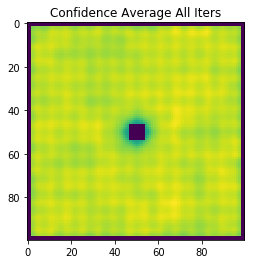

In [9]:
fig, ax = plt.subplots()
im = ax.imshow(est_conf_avg_one_fixed_all_iters)
ax.set_title("Confidence Average All Iters")

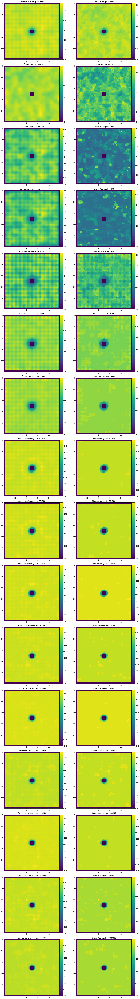

In [10]:
fig, axs = plt.subplots(16, 2, gridspec_kw={'width_ratios': [10, 10]}, figsize=(15,100))
im1 = axs[0, 0].imshow(est_conf_avg_one_fixed_all_iters)
axs[0, 0].set_title("Confidence Average All Iters")
divider = make_axes_locatable(axs[0, 0])
cax = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im1, cax=cax, orientation='vertical')
im2 = axs[0, 1].imshow(est_choice_avg_one_fixed_all_iters)
axs[0, 1].set_title("Choice Average All Iters")
divider = make_axes_locatable(axs[0, 1])
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im2, cax=cax, orientation='vertical')




for i, it in enumerate(iter_list):
    im1 = axs[i+1, 0].imshow(est_conf_avg_one_fixed[i])
    axs[i+1, 0].set_title("Confidence Average Iter " + str(it))
    divider = make_axes_locatable(axs[i+1, 0])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(im1, cax=cax, orientation='vertical')
    
    im2 = axs[i+1, 1].imshow(est_choice_avg_one_fixed[i])
    axs[i+1, 1].set_title("Choice Average Iter " + str(it))
    divider = make_axes_locatable(axs[i+1, 1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(im2, cax=cax, orientation='vertical')
    
plt.tight_layout()
plt.savefig('Results/20191002_FF_estimation_One_Fixed/heatmap_'+ model_name + '.png')